# Optical Character Recognition (OCR) - Azure Cognitive Services - Sections

## 1 Set the environment

### 1.1 Import Libraries

First, We need to import all the necessary libraries for this projet.

In [2]:
import os
import sys
import requests
# If you are using a Jupyter notebook, uncomment the following line.
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image
from io import BytesIO
import matplotlib
from os import path
import ast

### 1.2 Set the Azure Credentials

For calling the API, we need the endpoint and the subscription key of the Azure account. The following code is commonly used for storing this sensitive information. Once you run them, you can remove the code and call them back again using the os.environ['variable_name'].

In [9]:
# Set the Azure Credentials
#os.environ['COMPUTER_VISION_ENDPOINT'] = 'endpoint-info'
#os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY'] = 'suscription-key-info'

## 2 Call OCR API

### 2.1 Self-Detection

For calling the API we need the computer vision endpoint and computer vision suscription key. It can be obtained with an Azure Account. The following code generates a list containing nested dictionaries with the bounding boxes of each character as well as the recognized character.

In [ ]:

# Add your Computer Vision subscription key and endpoint to your environment variables.
if 'COMPUTER_VISION_SUBSCRIPTION_KEY' in os.environ:
    subscription_key = os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY']
else:
    print("\nSet the COMPUTER_VISION_SUBSCRIPTION_KEY environment variable.\n**Restart your shell or IDE for changes to take effect.**")
    sys.exit()

if 'COMPUTER_VISION_ENDPOINT' in os.environ:
    endpoint = os.environ['COMPUTER_VISION_ENDPOINT']

ocr_url = endpoint + "vision/v3.0/ocr"

# Set image_url to the URL of an image that you want to analyze.
#image_url = 'https://github.com/RohanAlexander/japanese_dictionaries/blob/mater/inputs/00-sample_pages_3_sec_1.png?raw=true'


#headers = {'Ocp-Apim-Subscription-Key': subscription_key} #If we send an url we need this one instead
headers = {'Ocp-Apim-Subscription-Key': subscription_key, 'Content-Type': 'application/octet-stream'}


params = {'language': 'unk', 'detectOrientation': 'true'} #Can also be used 'language': 'ja' for japanese only. unk means self detection 

image_path = path.expanduser(r'E:\Users\Usuario\Documents\GitHub_Website\website\japanese_dictionaries\inputs\cropped pages\00-sample_pages_3_sec_1.png')
image_data = open(image_path, "rb").read()

#data = {'url': image_url} #Only if we send an url instead 

response = requests.post(ocr_url, headers=headers, params=params, data=image_data)#json=data) when we send an url intead, we need json=data
response.raise_for_status()

analysis = response.json()

# Extract the word bounding boxes and text.
line_infos = [region["lines"] for region in analysis["regions"]]
word_infos = []
for region in analysis['regions']:
    
    word_infos.append(ast.literal_eval(str("{'boundingBox':'" + region["boundingBox"] + "','text':'region_in_text'}")))
for line in line_infos:
    for word_metadata in line:
        word_infos.append(ast.literal_eval(str("{'boundingBox':'" + word_metadata["boundingBox"] + "','text':'lines_in_text'}")))
        for word_info in word_metadata["words"]:
            word_infos.append(word_info)
word_infos


This is the structure of the API response

In [3]:
analysis

{'language': 'ja',
 'textAngle': 0.0,
 'orientation': 'Up',
 'regions': [{'boundingBox': '16,6,2379,1027',
   'lines': [{'boundingBox': '1115,6,57,1017',
     'words': [{'boundingBox': '1117,6,53,53', 'text': 'あ'},
      {'boundingBox': '1119,70,53,41', 'text': 'い'},
      {'boundingBox': '1139,116,9,17', 'text': ','},
      {'boundingBox': '1117,140,53,43', 'text': 'い'},
      {'boundingBox': '1119,192,51,51', 'text': 'ん'},
      {'boundingBox': '1119,322,51,15', 'text': '〔'},
      {'boundingBox': '1115,340,57,51', 'text': '合'},
      {'boundingBox': '1121,398,45,51', 'text': '印'},
      {'boundingBox': '1119,450,51,17', 'text': '〕'},
      {'boundingBox': '1123,482,47,17', 'text': '('},
      {'boundingBox': '1123,499,43,44', 'text': '名'},
      {'boundingBox': '1123,544,47,17', 'text': ')'},
      {'boundingBox': '1131,580,41,41', 'text': '帳'},
      {'boundingBox': '1131,688,41,41', 'text': '書'},
      {'boundingBox': '1131,732,41,39', 'text': '類'},
      {'boundingBox': '1133,778

### 2.2 Language Parameter = Japanese

Same as the previous one, this code recognizes the characters but having the language parameter as japanese in advance. 

In [4]:

# Add your Computer Vision subscription key and endpoint to your environment variables.
if 'COMPUTER_VISION_SUBSCRIPTION_KEY' in os.environ:
    subscription_key = os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY']
else:
    print("\nSet the COMPUTER_VISION_SUBSCRIPTION_KEY environment variable.\n**Restart your shell or IDE for changes to take effect.**")
    sys.exit()

if 'COMPUTER_VISION_ENDPOINT' in os.environ:
    endpoint = os.environ['COMPUTER_VISION_ENDPOINT']

ocr_url = endpoint + "vision/v3.0/ocr"

# Set image_url to the URL of an image that you want to analyze.
#image_url = 'https://github.com/RohanAlexander/japanese_dictionaries/blob/mater/inputs/00-sample_pages_3_sec_1.png?raw=true'


#headers = {'Ocp-Apim-Subscription-Key': subscription_key} #If we send an url we need this one instead
headers = {'Ocp-Apim-Subscription-Key': subscription_key, 'Content-Type': 'application/octet-stream'}


params = {'language': 'ja', 'detectOrientation': 'true'} #Can also be used 'language': 'ja' for japanese only. unk means self detection 

image_path = path.expanduser(r'E:\Users\Usuario\Documents\GitHub_Website\website\japanese_dictionaries\inputs\cropped pages\00-sample_pages_3_sec_1.png')
image_data = open(image_path, "rb").read()

#data = {'url': image_url} #Only if we send an url instead 

response = requests.post(ocr_url, headers=headers, params=params, data=image_data)#json=data) when we send an url intead, we need json=data
response.raise_for_status()

analysis = response.json()

# Extract the word bounding boxes and text.
line_infos = [region["lines"] for region in analysis["regions"]]
word_infos_jap = []
for region in analysis['regions']:
    
    word_infos_jap.append(ast.literal_eval(str("{'boundingBox':'" + region["boundingBox"] + "','text':'region_in_text'}")))
for line in line_infos:
    for word_metadata in line:
        word_infos_jap.append(ast.literal_eval(str("{'boundingBox':'" + word_metadata["boundingBox"] + "','text':'lines_in_text'}")))
        for word_info in word_metadata["words"]:
            word_infos_jap.append(word_info)
word_infos_jap


[{'boundingBox': '16,6,2379,1027', 'text': 'region_in_text'},
 {'boundingBox': '2348,68,47,963', 'text': 'lines_in_text'},
 {'boundingBox': '2352,68,39,9', 'text': '一'},
 {'boundingBox': '2348,96,43,41', 'text': '本'},
 {'boundingBox': '2352,142,37,31', 'text': 'の'},
 {'boundingBox': '2352,182,41,39', 'text': '傘'},
 {'boundingBox': '2352,224,39,37', 'text': 'を'},
 {'boundingBox': '2352,270,41,31', 'text': 'ニ'},
 {'boundingBox': '2350,308,41,39', 'text': '人'},
 {'boundingBox': '2354,352,37,39', 'text': 'で'},
 {'boundingBox': '2358,396,23,35', 'text': 'さ'},
 {'boundingBox': '2354,436,35,39', 'text': 'す'},
 {'boundingBox': '2362,482,21,35', 'text': 'こ'},
 {'boundingBox': '2358,524,23,39', 'text': 'と'},
 {'boundingBox': '2374,564,19,21', 'text': '。'},
 {'boundingBox': '2352,606,39,41', 'text': '多'},
 {'boundingBox': '2360,648,19,41', 'text': 'く'},
 {'boundingBox': '2350,692,41,39', 'text': '男'},
 {'boundingBox': '2350,734,41,41', 'text': '女'},
 {'boundingBox': '2354,782,33,7', 'text': '一'},

### Print All Characters by Line Number

In [5]:
count = 0
for item in word_infos_jap:
    if not item['text'] in ['region_in_text']:
        if item['text'] in ['lines_in_text']:
            count +=1
            #print('lines_in_text: ' + str(count))
            
        else:
            print(item['text'] + " " + str(count))





一 1
本 1
の 1
傘 1
を 1
ニ 1
人 1
で 1
さ 1
す 1
こ 1
と 1
。 1
多 1
く 1
男 1
女 1
一 1
一 1
人 1
の 1
場 1
合 1
に 1
い 2
ふ 2
。 2
あ 2
ひ 2
が 2
さ 2
。 2
ア 3
イ 3
ア 3
ン 3
(Iron 3
〕 3
( 3
名 3
) 3
( 3
通 3
に 3
は 3
な 3
ま 3
っ 3
て 3
、 3
「 3
ア 3
イ 3
ロ 3
ン 4
」 4
と 4
い 4
ふ 4
ソ 4
0 4
鐡 4
又 4
は 4
鐵 4
製 4
品 4
。 4
・ 4
西 4
洋 4
ひ 4
の 4
し 4
。 4
0 4
髮 5
の 5
毛 5
を 5
ら 5
せ 5
る 5
小 5
形 5
の 5
。 5
3 5
・ 5
コ 5
ル 5
フ 5
用 5
の 5
の 5
杖 6
。 6
ー 6
・ 6
デ 6
ィ 6
シ 6
プ 6
リ 6
ン 6
〔 6
Iron 6
discipline 6
〕 6
( 6
名 6
) 6
【 7
軍 7
人 7
に 7
對 7
す 7
る 7
軍 7
律 7
、 7
又 7
は 7
共 7
産 7
黨 7
員 7
に 7
對 7
す 7
る 7
黨 7
律 7
の 8
ロ 8
く 8
、 8
絶 8
對 8
に 8
破 8
る 8
べ 8
か 8
ら 8
ざ 8
み 8
規 8
律 8
。 8
ron 9
law 9
〕 9
( 9
名 9
) 9
0 9
人 9
間 9
の 9
意 9
思 9
で 9
は 9
す 9
る 9
こ 9
と 9
の 9
で 10
き 10
ぬ 10
法 10
期 10
。 10
餓 10
則 10
。 10
0 10
【 10
經 10
】 10
賃 10
銀 10
餓 10
則 10
。 10
現 10
在 10
の 10
資 10
本 10
主 10
義 10
經 11
濟 11
組 11
織 11
で 11
は 11
、 11
勞 11
働 11
者 11
の 11
賃 11
銀 11
は 11
加 11
さ 11
せ 11
る 11
望 11
み 11
が 11
な 11
レ 12
と 12
い 12
ふ 12
ラ 12
ッ 12
サ 12
ー 12
ル 12
の 12
設 12
。 12
卲 12


## 3 Print characters over the canvas - Self-Detection

This code prints the different boundaries recognized by the API, those are the regions, the lines and the characters

In [6]:
#image = Image.open(BytesIO(requests.get(image_url).content))
image = Image.open(image_path)

### 3.1 Print regions

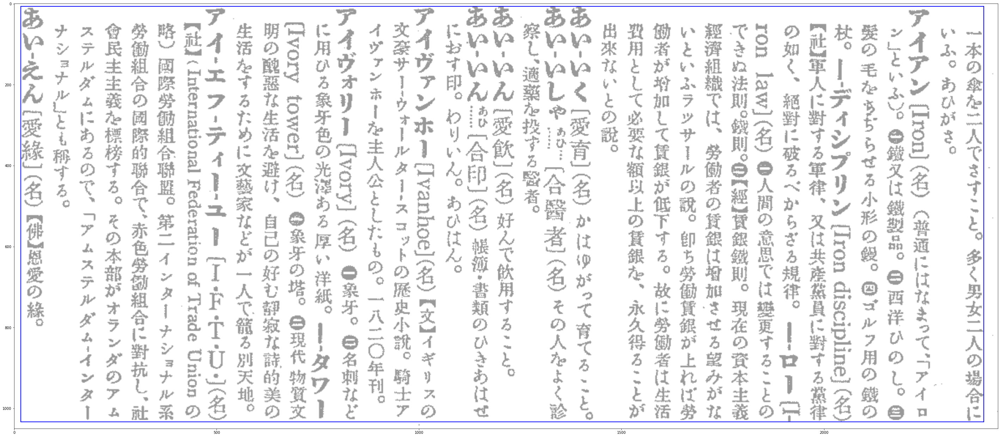

(0.0, 1.0, 0.0, 1.0)

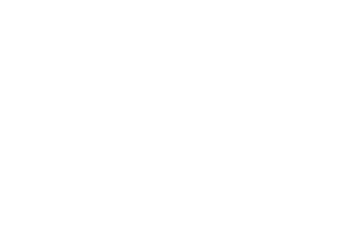

In [7]:
# Display the image and overlay it with the extracted text.
plt.figure(figsize=(50,50))
ax = plt.imshow(image, alpha=0.4)
for word in word_infos:
    bbox = [int(num) for num in word["boundingBox"].split(",")]
    text = word["text"]
    #print(text)
    if text == 'region_in_text':
        origin = (bbox[0], bbox[1])
        patch = Rectangle(origin, bbox[2], bbox[3],
                          fill=False, linewidth=2, color='b', label = 'label')
        ax.axes.add_patch(patch)

        #ax.axes.text(origin[0], origin[1], text, size = 20, weight="bold", va="top")#, fontproperties = font)

plt.show()
plt.axis("off")

### 3.2 Print Lines

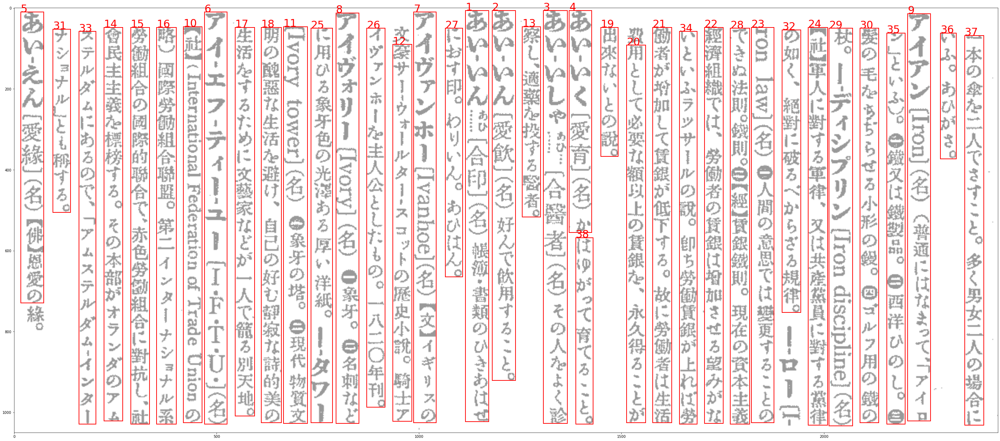

(0.0, 1.0, 0.0, 1.0)

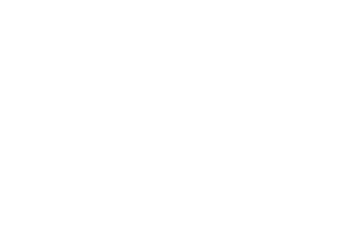

In [11]:
# Display the image and overlay it with the extracted text.
plt.figure(figsize=(50,50))
ax = plt.imshow(image, alpha=0.4)
count = 1
for word in word_infos:
    bbox = [int(num) for num in word["boundingBox"].split(",")]
    text = word["text"]
    #print(text)
    if text == 'lines_in_text':
        origin = (bbox[0], bbox[1])
        patch = Rectangle(origin, bbox[2], bbox[3],
                          fill=False, linewidth=2, color='r', label = 'label')
        ax.axes.add_patch(patch)
        ax.axes.text(origin[0], origin[1], count, size = 30, color = 'r')
        count += 1
        #ax.axes.text(origin[0], origin[1], text, size = 20, weight="bold", va="top")#, fontproperties = font)

plt.show()
plt.axis("off")

### 3.3 Print Character Boundaries

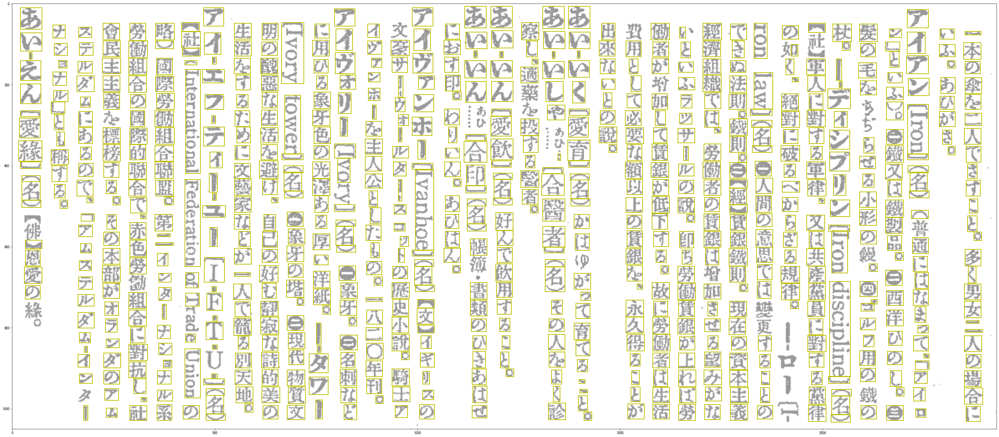

(0.0, 1.0, 0.0, 1.0)

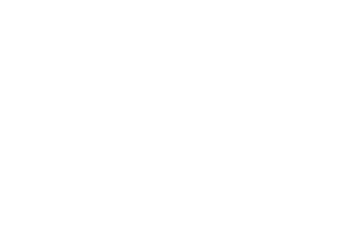

In [10]:
# Display the image and overlay it with the extracted text.
plt.figure(figsize=(50,50))
plt.rcParams['font.sans-serif'] = ['MS Gothic', 'sans-serif']
ax = plt.imshow(image, alpha=0.4)
for word in word_infos:
    bbox = [int(num) for num in word["boundingBox"].split(",")]
    text = word["text"]
    #print(text)
    if not text == 'lines_in_text' and not text == 'region_in_text':
        origin = (bbox[0], bbox[1])
        patch = Rectangle(origin, bbox[2], bbox[3],
                          fill=False, linewidth=2, label = 'label', color='y')
        ax.axes.add_patch(patch)

        #ax.axes.text(origin[0], origin[1], text, size = 25, weight="bold", va="top")#, fontproperties = font)

plt.show()
plt.axis("off")

### 3.4 Print Characters

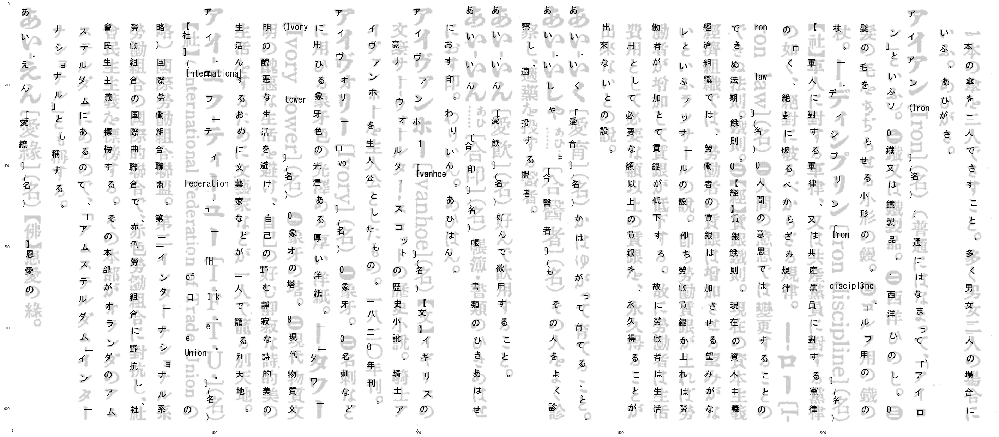

(0.0, 1.0, 0.0, 1.0)

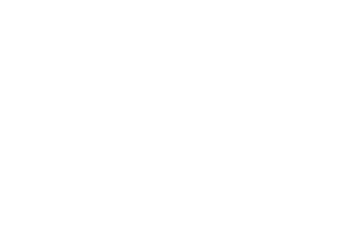

In [11]:
# Display the image and overlay it with the extracted text.
plt.figure(figsize=(50,50))
plt.rcParams['font.sans-serif'] = ['MS Gothic', 'sans-serif']
ax = plt.imshow(image, alpha=0.2)
for word in word_infos:
    bbox = [int(num) for num in word["boundingBox"].split(",")]
    text = word["text"]
    #print(text)
    if not text == 'lines_in_text' and not text == 'region_in_text':
        origin = (bbox[0], bbox[1])
        patch = Rectangle(origin, bbox[2], bbox[3],
                          fill=False, linewidth=2, label = 'label', color='y')
        #ax.axes.add_patch(patch)

        ax.axes.text(origin[0], origin[1], text, size = 25, weight="bold", va="top")

plt.show()
plt.axis("off")

## 4. Validating second section

### 4.1 Language Parameter = Japanese

Same as the previous one, this code recognizes the characters but having the language parameter as japanese in advance. 

In [14]:

# Add your Computer Vision subscription key and endpoint to your environment variables.
if 'COMPUTER_VISION_SUBSCRIPTION_KEY' in os.environ:
    subscription_key = os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY']
else:
    print("\nSet the COMPUTER_VISION_SUBSCRIPTION_KEY environment variable.\n**Restart your shell or IDE for changes to take effect.**")
    sys.exit()

if 'COMPUTER_VISION_ENDPOINT' in os.environ:
    endpoint = os.environ['COMPUTER_VISION_ENDPOINT']

ocr_url = endpoint + "vision/v3.0/ocr"

# Set image_url to the URL of an image that you want to analyze.
#image_url = 'https://github.com/RohanAlexander/japanese_dictionaries/blob/mater/inputs/00-sample_pages_3_sec_1.png?raw=true'


#headers = {'Ocp-Apim-Subscription-Key': subscription_key} #If we send an url we need this one instead
headers = {'Ocp-Apim-Subscription-Key': subscription_key, 'Content-Type': 'application/octet-stream'}


params = {'language': 'ja', 'detectOrientation': 'true'} #Can also be used 'language': 'ja' for japanese only. unk means self detection 

image_path = path.expanduser(r'E:\Users\Usuario\Documents\GitHub_Website\website\japanese_dictionaries\inputs\cropped pages\00-sample_pages_3_sec_2.png')
image_data = open(image_path, "rb").read()

#data = {'url': image_url} #Only if we send an url instead 

response = requests.post(ocr_url, headers=headers, params=params, data=image_data)#json=data) when we send an url intead, we need json=data
response.raise_for_status()

analysis = response.json()

# Extract the word bounding boxes and text.
line_infos = [region["lines"] for region in analysis["regions"]]
word_infos_jap = []
for region in analysis['regions']:
    
    word_infos_jap.append(ast.literal_eval(str("{'boundingBox':'" + region["boundingBox"] + "','text':'region_in_text'}")))
for line in line_infos:
    for word_metadata in line:
        word_infos_jap.append(ast.literal_eval(str("{'boundingBox':'" + word_metadata["boundingBox"] + "','text':'lines_in_text'}")))
        for word_info in word_metadata["words"]:
            word_infos_jap.append(word_info)
word_infos_jap


[{'boundingBox': '18,7,2377,1031', 'text': 'region_in_text'},
 {'boundingBox': '2338,13,57,1025', 'text': 'lines_in_text'},
 {'boundingBox': '2340,13,53,54', 'text': 'あ'},
 {'boundingBox': '2340,76,53,43', 'text': 'い'},
 {'boundingBox': '2362,124,9,17', 'text': '・'},
 {'boundingBox': '2340,142,53,51', 'text': 'え'},
 {'boundingBox': '2338,201,53,50', 'text': 'ん'},
 {'boundingBox': '2338,340,53,17', 'text': '〔'},
 {'boundingBox': '2338,359,57,52', 'text': '哀'},
 {'boundingBox': '2338,415,55,50', 'text': '婉'},
 {'boundingBox': '2340,468,51,18', 'text': '〕'},
 {'boundingBox': '2346,502,47,15', 'text': '('},
 {'boundingBox': '2346,517,43,46', 'text': '名'},
 {'boundingBox': '2344,562,47,19', 'text': ')'},
 {'boundingBox': '2352,600,39,41', 'text': '哀'},
 {'boundingBox': '2352,642,41,42', 'text': 'れ'},
 {'boundingBox': '2354,688,35,39', 'text': 'に'},
 {'boundingBox': '2350,735,41,30', 'text': 'や'},
 {'boundingBox': '2362,776,21,35', 'text': 'さ'},
 {'boundingBox': '2362,822,29,40', 'text': 'し'

In [15]:
count = 0
for item in word_infos_jap:
    if not item['text'] in ['region_in_text']:
        if item['text'] in ['lines_in_text']:
            count +=1
            #print('lines_in_text: ' + str(count))
            
        else:
            print(item['text'] + " " + str(count))





あ 1
い 1
・ 1
え 1
ん 1
〔 1
哀 1
婉 1
〕 1
( 1
名 1
) 1
哀 1
れ 1
に 1
や 1
さ 1
し 1
い 1
こ 1
と 1
。 1
あ 2
い 2
・ 2
え 2
ん 2
〔 2
哀 2
猿 2
〕 2
( 2
名 2
) 2
悲 2
し 2
い 2
聲 2
で 2
啼 2
く 2
猿 2
。 2
あ 3
い 3
, 3
え 3
ん 3
〔 3
合 3
〕 3
( 3
名 3
) 3
む 3
つ 3
び 3
あ 3
ふ 3
こ 3
と 3
の 3
で 3
き 3
る 4
ー 4
害 4
え 4
ん 4
〔 4
合 4
綠 4
奇 4
綠 4
〕 4
( 4
名 4
) 4
0 4
合 4
ふ 4
も 4
合 4
は 5
ぬ 5
も 5
綠 5
に 5
よ 5
ろ 5
こ 5
と 5
。 5
不 5
思 5
議 5
な 5
。 5
あ 6
い 6
ー 6
お 6
い 6
〔 6
相 6
生 6
〕 6
( 6
名 6
) 6
い 6
っ 6
し 6
ょ 6
に 6
生 6
ひ 6
出 6
る 6
こ 6
と 7
。 7
お 7
な 7
い 7
ど 7
し 7
。 7
ー 7
・ 7
ざ 7
し 7
〔 7
相 7
生 7
插 7
〕 7
( 7
名 7
) 7
男 7
松 7
と 7
女 8
松 8
と 8
を 8
插 8
し 8
、 8
根 8
じ 8
め 8
に 8
柑 8
子 8
を 8
用 8
ひ 8
れ 8
も 8
の 8
。 8
の 9
・ 9
ま 9
っ 9
〔 9
相 9
生 9
松 9
〕 9
( 9
名 9
) 9
丘 9
( 9
庫 9
縣 9
加 9
古 9
郡 9
高 9
砂 9
町 9
高 9
砂 9
社 10
の 10
境 10
内 10
の 10
靈 10
松 10
。 10
嵩 10
砂 10
の 10
松 10
。 10
ー 10
・ 10
ぼ 10
ん 10
〔 10
相 10
生 10
盆 10
〕 10
( 11
名 11
) 11
婚 11
禮 11
の 11
折 11
に 11
用 11
び 11
る 11
男 11
島 11
と 11
女 11
島 11
と 11
を 11
並 11
べ 11
れ 11
盆 11
景 11
。 11
ー 12
, 12
む 12
す 12
び 

### First Line - Japanese

In [16]:
#image = Image.open(BytesIO(requests.get(image_url).content))
image = Image.open(image_path)

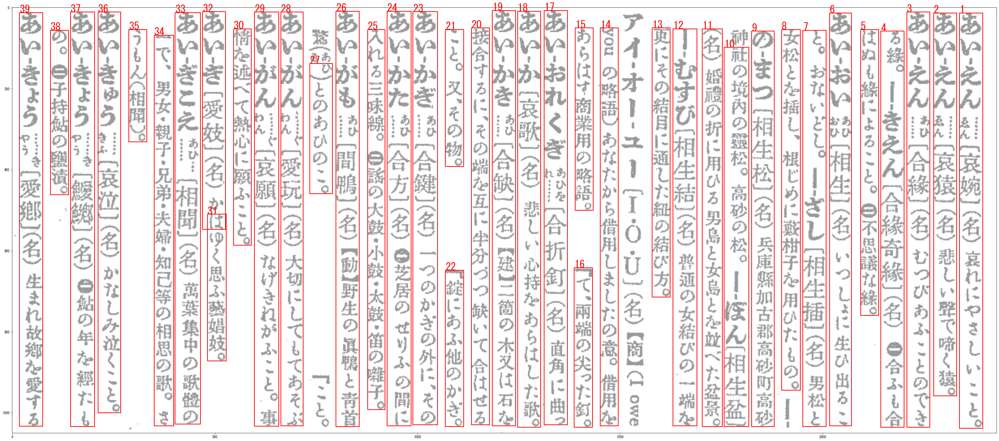

(0.0, 1.0, 0.0, 1.0)

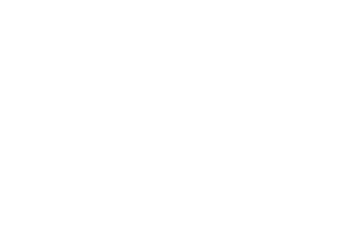

In [17]:
# Display the image and overlay it with the extracted text.
plt.figure(figsize=(50,50))
ax = plt.imshow(image, alpha=0.4)
count = 1
for word in word_infos_jap:
    bbox = [int(num) for num in word["boundingBox"].split(",")]
    text = word["text"]
    #print(text)
    if text == 'lines_in_text':
        origin = (bbox[0], bbox[1])
        patch = Rectangle(origin, bbox[2], bbox[3],
                          fill=False, linewidth=2, color='r', label = 'label')
        ax.axes.add_patch(patch)

        #ax.axes.text(origin[0], origin[1], text, size = 20, weight="bold", va="top")#, fontproperties = font)
        ax.axes.text(origin[0], origin[1], count, size = 30, color = 'r')
        count += 1
plt.show()
plt.axis("off")

## 5. Validating third section

### 5.1 Language Parameter = Japanese

Same as the previous one, this code recognizes the characters but having the language parameter as japanese in advance. 

In [26]:

# Add your Computer Vision subscription key and endpoint to your environment variables.
if 'COMPUTER_VISION_SUBSCRIPTION_KEY' in os.environ:
    subscription_key = os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY']
else:
    print("\nSet the COMPUTER_VISION_SUBSCRIPTION_KEY environment variable.\n**Restart your shell or IDE for changes to take effect.**")
    sys.exit()

if 'COMPUTER_VISION_ENDPOINT' in os.environ:
    endpoint = os.environ['COMPUTER_VISION_ENDPOINT']

ocr_url = endpoint + "vision/v3.0/ocr"

# Set image_url to the URL of an image that you want to analyze.
#image_url = 'https://github.com/RohanAlexander/japanese_dictionaries/blob/mater/inputs/00-sample_pages_3_sec_1.png?raw=true'


#headers = {'Ocp-Apim-Subscription-Key': subscription_key} #If we send an url we need this one instead
headers = {'Ocp-Apim-Subscription-Key': subscription_key, 'Content-Type': 'application/octet-stream'}


params = {'language': 'ja', 'detectOrientation': 'true'} #Can also be used 'language': 'ja' for japanese only. unk means self detection 

image_path = path.expanduser(r'E:\Users\Usuario\Documents\GitHub_Website\website\japanese_dictionaries\inputs\cropped pages\00-sample_pages_3_sec_3.png')
image_data = open(image_path, "rb").read()

#data = {'url': image_url} #Only if we send an url instead 

response = requests.post(ocr_url, headers=headers, params=params, data=image_data)#json=data) when we send an url intead, we need json=data
response.raise_for_status()

analysis = response.json()

# Extract the word bounding boxes and text.
line_infos = [region["lines"] for region in analysis["regions"]]
word_infos_jap = []
for region in analysis['regions']:
    
    word_infos_jap.append(ast.literal_eval(str("{'boundingBox':'" + region["boundingBox"] + "','text':'region_in_text'}")))
for line in line_infos:
    for word_metadata in line:
        word_infos_jap.append(ast.literal_eval(str("{'boundingBox':'" + word_metadata["boundingBox"] + "','text':'lines_in_text'}")))
        for word_info in word_metadata["words"]:
            word_infos_jap.append(word_info)
word_infos_jap


[{'boundingBox': '30,3,2363,1027', 'text': 'region_in_text'},
 {'boundingBox': '2334,50,59,872', 'text': 'lines_in_text'},
 {'boundingBox': '2364,50,21,38', 'text': 'こ'},
 {'boundingBox': '2360,93,23,38', 'text': 'と'},
 {'boundingBox': '2372,135,19,21', 'text': '。'},
 {'boundingBox': '2360,176,11,54', 'text': 'ー'},
 {'boundingBox': '2360,232,9,17', 'text': ','},
 {'boundingBox': '2344,250,45,49', 'text': 'し'},
 {'boundingBox': '2338,309,55,49', 'text': 'ん'},
 {'boundingBox': '2338,372,53,18', 'text': '〔'},
 {'boundingBox': '2336,393,53,49', 'text': '愛'},
 {'boundingBox': '2334,447,59,55', 'text': '鄕'},
 {'boundingBox': '2338,508,53,46', 'text': '心'},
 {'boundingBox': '2338,558,51,16', 'text': '〕'},
 {'boundingBox': '2344,589,47,17', 'text': '('},
 {'boundingBox': '2344,605,43,47', 'text': '名'},
 {'boundingBox': '2344,653,47,15', 'text': ')'},
 {'boundingBox': '2354,689,39,39', 'text': '愛'},
 {'boundingBox': '2350,727,43,46', 'text': '鄕'},
 {'boundingBox': '2352,777,37,33', 'text': 'の'}

In [27]:
count = 0
for item in word_infos_jap:
    if not item['text'] in ['region_in_text']:
        if item['text'] in ['lines_in_text']:
            count +=1
            #print('lines_in_text: ' + str(count))
            
        else:
            print(item['text'] + " " + str(count))





こ 1
と 1
。 1
ー 1
, 1
し 1
ん 1
〔 1
愛 1
鄕 1
心 1
〕 1
( 1
名 1
) 1
愛 1
鄕 1
の 1
棈 1
神 1
。 1
あ 2
い 2
・ 2
き 2
よ 2
う 2
き 2
〔 2
愛 2
敬 2
〕 2
( 2
名 2
) 2
0 2
人 2
づ 2
き 2
の 2
よ 2
い 2
こ 2
と 3
。 3
わ 3
い 3
そ 3
の 3
よ 3
い 3
こ 3
と 3
。 3
世 3
辭 3
の 3
よ 3
い 3
こ 3
と 3
。 3
O 3
の 3
か 3
は 4
ゆ 4
ら 4
し 4
い 4
こ 4
と 4
。 4
0 4
俳 4
優 4
が 4
花 4
道 4
で 4
見 4
物 4
の 4
方 4
へ 4
見 4
え 4
な 4
す 5
る 5
、 5
と 5
0 5
! 6
あ 6
い 6
ぜ 6
ん 6
〔 6
愛 6
敬 6
愛 6
染 6
〕 6
( 6
き 6
【 6
佛 6
】 6
( 7
あ 7
》 7
ぜ 7
ん 7
み 7
よ 7
う 7
お 7
う 7
X 7
染 7
明 7
王 7
) 7
。 7
ー 7
・ 7
あ 7
ば 7
た 7
〔 7
愛 7
敬 8
痘 8
痕 8
〕 8
( 8
名 8
) 8
愛 8
敬 8
が 8
あ 8
る 8
や 8
う 8
に 8
見 8
え 8
る 8
あ 8
ば 8
ー 9
・ 9
げ 9
〔 9
愛 9
敬 9
毛 9
〕 9
( 9
名 9
) 9
女 9
の 9
や 9
頭 9
髮 9
の 9
お 9
く 9
れ 9
毛 9
。 9
顏 9
に 10
愛 10
敬 10
を 10
添 10
へ 10
ら 10
か 10
ら 10
い 10
ふ 10
。 10
ー 10
・ 10
し 10
よ 10
ら 10
ば 10
い 10
Ⅱ 10
埓 10
〔 11
愛 11
敬 11
商 11
賣 11
〕 11
( 11
名 11
) 11
待 11
合 11
。 11
遊 11
郭 11
。 11
愛 11
敬 11
が 11
な 11
く 11
て 11
は 11
立 11
キ 12
っ 12
ゅ 12
・ 12
か 12
ぬ 12
力 12
、 12
り 12
ー 12
ー 12
ず 13
き 13
あ 13
い 13
引 13


### First Line - Japanese

In [28]:
#image = Image.open(BytesIO(requests.get(image_url).content))
image = Image.open(image_path)

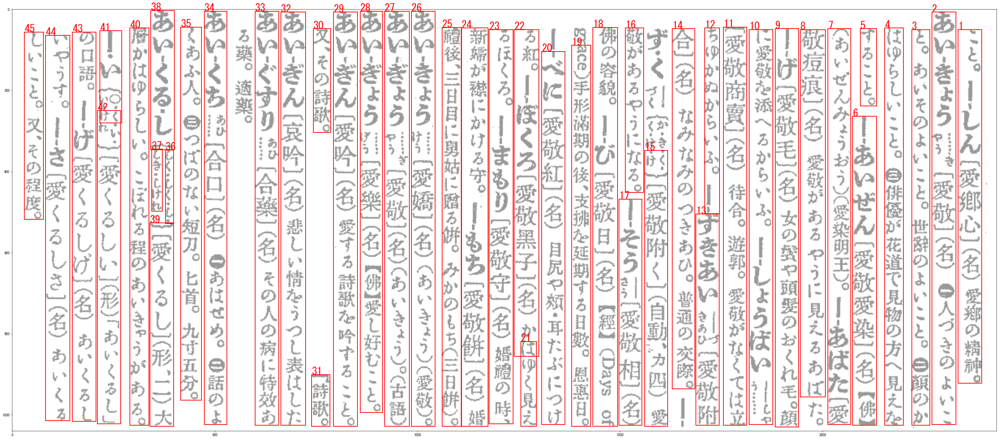

(0.0, 1.0, 0.0, 1.0)

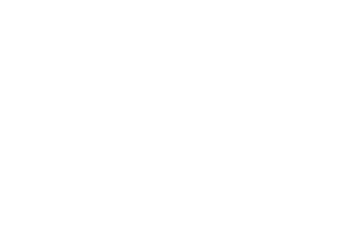

In [29]:
# Display the image and overlay it with the extracted text.
plt.figure(figsize=(50,50))
ax = plt.imshow(image, alpha=0.4)
count = 1
for word in word_infos_jap:
    bbox = [int(num) for num in word["boundingBox"].split(",")]
    text = word["text"]
    #print(text)
    if text == 'lines_in_text':
        origin = (bbox[0], bbox[1])
        patch = Rectangle(origin, bbox[2], bbox[3],
                          fill=False, linewidth=2, color='r', label = 'label')
        ax.axes.add_patch(patch)

        #ax.axes.text(origin[0], origin[1], text, size = 20, weight="bold", va="top")#, fontproperties = font)
        ax.axes.text(origin[0], origin[1], count, size = 30, color = 'r')
        count += 1
plt.show()
plt.axis("off")

## 6. Validating fourth section

### 6.1 Language Parameter = Japanese

Same as the previous one, this code recognizes the characters but having the language parameter as japanese in advance. 

In [22]:

# Add your Computer Vision subscription key and endpoint to your environment variables.
if 'COMPUTER_VISION_SUBSCRIPTION_KEY' in os.environ:
    subscription_key = os.environ['COMPUTER_VISION_SUBSCRIPTION_KEY']
else:
    print("\nSet the COMPUTER_VISION_SUBSCRIPTION_KEY environment variable.\n**Restart your shell or IDE for changes to take effect.**")
    sys.exit()

if 'COMPUTER_VISION_ENDPOINT' in os.environ:
    endpoint = os.environ['COMPUTER_VISION_ENDPOINT']

ocr_url = endpoint + "vision/v3.0/ocr"

# Set image_url to the URL of an image that you want to analyze.
#image_url = 'https://github.com/RohanAlexander/japanese_dictionaries/blob/mater/inputs/00-sample_pages_3_sec_1.png?raw=true'


#headers = {'Ocp-Apim-Subscription-Key': subscription_key} #If we send an url we need this one instead
headers = {'Ocp-Apim-Subscription-Key': subscription_key, 'Content-Type': 'application/octet-stream'}


params = {'language': 'ja', 'detectOrientation': 'true'} #Can also be used 'language': 'ja' for japanese only. unk means self detection 

image_path = path.expanduser(r'E:\Users\Usuario\Documents\GitHub_Website\website\japanese_dictionaries\inputs\cropped pages\00-sample_pages_3_sec_4.png')
image_data = open(image_path, "rb").read()

#data = {'url': image_url} #Only if we send an url instead 

response = requests.post(ocr_url, headers=headers, params=params, data=image_data)#json=data) when we send an url intead, we need json=data
response.raise_for_status()

analysis = response.json()

# Extract the word bounding boxes and text.
line_infos = [region["lines"] for region in analysis["regions"]]
word_infos_jap = []
for region in analysis['regions']:
    
    word_infos_jap.append(ast.literal_eval(str("{'boundingBox':'" + region["boundingBox"] + "','text':'region_in_text'}")))
for line in line_infos:
    for word_metadata in line:
        word_infos_jap.append(ast.literal_eval(str("{'boundingBox':'" + word_metadata["boundingBox"] + "','text':'lines_in_text'}")))
        for word_info in word_metadata["words"]:
            word_infos_jap.append(word_info)
word_infos_jap


[{'boundingBox': '28,7,2363,1031', 'text': 'region_in_text'},
 {'boundingBox': '2336,9,55,641', 'text': 'lines_in_text'},
 {'boundingBox': '2340,9,51,53', 'text': 'あ'},
 {'boundingBox': '2340,73,51,41', 'text': 'い'},
 {'boundingBox': '2344,123,43,53', 'text': 'ぐ'},
 {'boundingBox': '2338,181,53,51', 'text': 'ん'},
 {'boundingBox': '2360,233,7,17', 'text': '・'},
 {'boundingBox': '2346,251,43,51', 'text': 'じ'},
 {'boundingBox': '2356,307,31,39', 'text': 'よ'},
 {'boundingBox': '2344,351,37,57', 'text': 'う'},
 {'boundingBox': '2336,413,55,47', 'text': 'や'},
 {'boundingBox': '2346,469,31,51', 'text': 'く'},
 {'boundingBox': '2344,603,37,17', 'text': '〔'},
 {'boundingBox': '2344,623,7,27', 'text': 'ま'},
 {'boundingBox': '2334,631,57,399', 'text': 'lines_in_text'},
 {'boundingBox': '2372,631,7,17', 'text': '='},
 {'boundingBox': '2336,661,53,15', 'text': '〔'},
 {'boundingBox': '2336,681,51,51', 'text': '愛'},
 {'boundingBox': '2334,739,55,53', 'text': '琿'},
 {'boundingBox': '2336,801,55,53', 'te

In [23]:
count = 0
for item in word_infos_jap:
    if not item['text'] in ['region_in_text']:
        if item['text'] in ['lines_in_text']:
            count +=1
            #print('lines_in_text: ' + str(count))
            
        else:
            print(item['text'] + " " + str(count))





あ 1
い 1
ぐ 1
ん 1
・ 1
じ 1
よ 1
う 1
や 1
く 1
〔 1
ま 1
= 2
〔 2
愛 2
琿 2
條 2
約 2
〕 2
( 2
名 2
) 2
暉 3
は 3
滿 3
洲 3
国 3
黒 3
龍 3
江 3
省 3
の 3
都 3
會 3
。 3
成 3
豐 3
八 3
年 3
( 3
一 3
入 3
五 3
八 3
) 3
清 4
・ 4
の 4
間 4
に 4
黒 4
龍 4
江 4
を 4
兩 4
回 4
の 4
朝 4
境 4
と 4
す 4
る 4
こ 4
と 4
に 4
就 4
て 5
、 5
こ 5
の 5
地 5
で 5
結 5
ば 5
れ 5
條 5
約 5
。 5
あ 6
い 6
・ 6
け 6
あ 6
? 6
・ 6
霹 6
氣 6
〕 6
( 6
き 6
藍 6
色 6
帶 6
び 6
て 6
ゐ 6
る 6
こ 6
と 6
。 6
ー 7
・ 7
ね 7
ず 7
み 7
〔 7
藍 7
氣 7
鼠 7
〕 7
( 7
名 7
) 7
( 7
あ 7
い 7
れ 7
す 7
み 7
) 7
。 7
あ 8
い 8
・ 8
け 8
い 8
〔 8
愛 8
敬 8
〕 8
( 8
名 8
) 8
愛 8
し 8
敬 8
ふ 8
こ 8
と 8
。 8
あ 9
い 9
・ 9
け 9
ん 9
綣 9
〔 9
合 9
拳 9
〕 9
( 9
名 9
) 9
0 9
拳 9
の 9
遊 9
技 9
で 9
一 9
一 9
人 9
が 9
同 9
じ 10
手 10
を 10
出 10
す 10
こ 10
と 10
。 10
れ 10
あ 10
ひ 10
。 10
合 10
意 10
。 10
あ 11
い 11
, 11
げ 11
ん 11
〔 11
愛 11
眼 11
〕 11
) 11
【 11
佛 11
】 11
佛 11
の 11
慈 11
悲 11
の 11
服 11
。 11
あ 12
い 12
と 12
〔 12
愛 12
顧 12
〕 12
( 12
き 12
目 12
を 12
か 12
け 12
て 12
や 12
こ 12
と 12
。 12
引 12
立 12
て 12
る 13
、 13
、 13
00 13
ひ 13
い 13
、 13
0 13
は 14
が 14
り 14
保 14
護 1

### First Line - Japanese

In [24]:
#image = Image.open(BytesIO(requests.get(image_url).content))
image = Image.open(image_path)

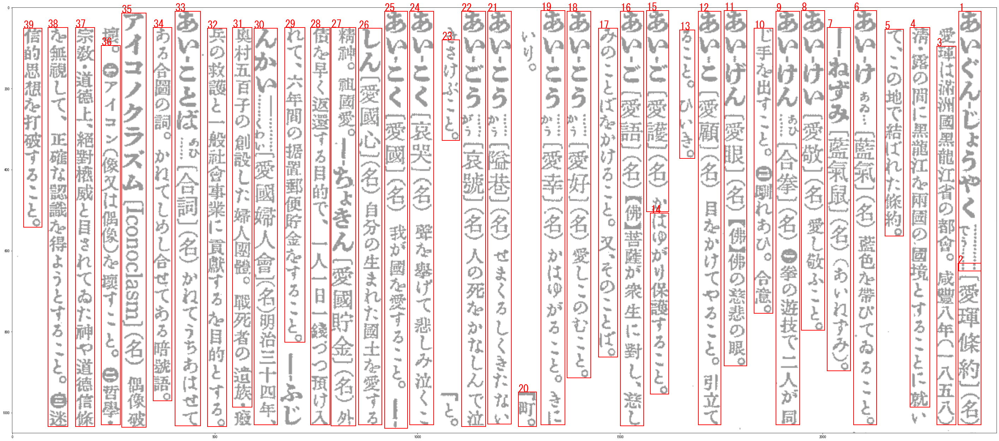

(0.0, 1.0, 0.0, 1.0)

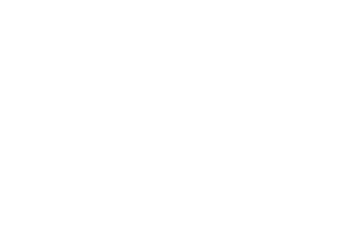

In [25]:
# Display the image and overlay it with the extracted text.
plt.figure(figsize=(50,50))
ax = plt.imshow(image, alpha=0.4)
count = 1
for word in word_infos_jap:
    bbox = [int(num) for num in word["boundingBox"].split(",")]
    text = word["text"]
    #print(text)
    if text == 'lines_in_text':
        origin = (bbox[0], bbox[1])
        patch = Rectangle(origin, bbox[2], bbox[3],
                          fill=False, linewidth=2, color='r', label = 'label')
        ax.axes.add_patch(patch)

        #ax.axes.text(origin[0], origin[1], text, size = 20, weight="bold", va="top")#, fontproperties = font)
        ax.axes.text(origin[0], origin[1], count, size = 30, color = 'r')
        count += 1
plt.show()
plt.axis("off")